<a href="https://colab.research.google.com/github/tbeedell/MLEndLS/blob/main/MLEndLS_miniproject_advanced.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ECS7020P mini-project **Basic component**

# 1 Author

**Student Name**: Thomas Beedell
 
**Student ID**: xxxxxxxxx



# 2 Problem formulation

A machine learning pipeline was built in order to classify whether an audio segement has been recorded at one of six locations. It was an extension to a problem of classiying audio segements as being recorded indoor or outdoor. This was a supervised machine learning problem as the audio segments are labelled and requires multiclass classification. It was an interesting problem to tackle as enviroment sounds are less structured than that of speech and music, which tend to be the focus of audio classification problems. There could be practical applications of this work, for example with smart home devices.

# 3 Machine Learning pipeline

Input: dataframe and .wav files

*   Data Cleaning
*   Feature extraction
*   Data Split
*   Data Normalization
*   Classifier (SVM to classify indoor or outdoor)

Output: classified audio files


# 4 Transformation stage

The classifier label for the six locations within an area was extracted from the dataframe. The classifier label for indoor was also extracted. In addition, the area and partipcant attributes were extracted in order to assist with data analysis.

The following four audio features are extracted:
*   Power
*   Pitch - mean
*   Pitch - standard deviation
*   Mel-frequency cepstral coefficients (MFCCs)

The classifier label, extracted attributes and audio features are filtered to be only for the 'campus' area. The dataset is then split into two with the first set comprising 80% of the original. This is used for training and validation, whilst the remaining 20% is used for testing.

Following the data split, the features are scaled using z-score (normalisation) to ensure feature magnitudes are not having an impact.

The audio features are extracted and calculated with specific approaches. The amplitudes are extracted and standardised by dividing by the maximum absolute value. This should protect against the recording device influencing it. Power is calculated as the mean of the sum of the squared amplitudes. Pitch is derived from the fundamental frequency (f0) estimation, of which mean and standard deviation are calculated. There are 20 MFCC sequences returned and the mean of each of these is calculated. MFC represents the power spectrum and requires a Short-time Fourier transformation (STFT) in order to apply it. There are numerous other audio features that could be extracted. Fraction of audio segment with voice and the chroma and contrast extractions from utilising librosa were considered but not selected.

# 5 Modelling

The indoor/outdoor classification problem utilised a Support Vector Machine model and so this was selected for this problem. This project has tuned the hyperparameters by utilising an exhaustive search with 5-fold cross-validation (GridSearchCV). The parameter settings that gave the best results were then implemented.

# 6 Methodology

The pipeline had been used to classify indoor and outdoor with a testing accuracy of 78%. The 'campus' area had the most samples and so was chosen for further analysis. Firstly it was reviewed whether the pipeline would perform better if trained on only data from this location. This was likely to reduce variation but also reduce the number of samples. Following that the hyperparameter tuning was implemented in order to train and validate the model. The overall performance was then assessed on the test dataset using a confusion matrix. The results per participant were also considered.

# 7 Dataset

The MLEnd London Sounds Dataset is a collection of 2500 samples described by 5 attributes:

*   Audio
*   Area
*   Spot
*   Whether indoor or outdoor
*   Participant

A dataframe of the file_ID for the audio along with the last four attributes is presented below:

In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob

from tqdm import tqdm
import IPython.display as ipd
import librosa
import librosa.display

drive.mount('/content/drive')

MLENDLS_df = pd.read_csv('/content/drive/MyDrive/MLEndLS/MLEndLS.csv').set_index('file_id') 
display(MLENDLS_df)

Mounted at /content/drive


,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


A sample audio is taken to demonstrate examples of the extractions. Below is a graph of the amplitudes against time and the audio file can also be played as well as summary of the attributes:

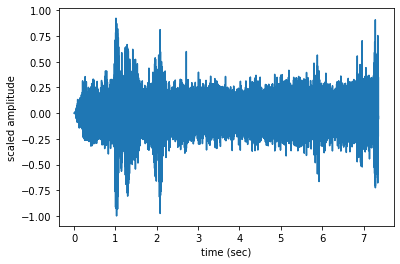

area           southbank
spot                book
in_out           outdoor
Participant         S102
Name: 1501.wav, dtype: object


In [ ]:
path = '/content/drive/MyDrive/MLEndLS/Audio/*.wav'
files = glob.glob(path)
glob.glob('./[0-9].*')

# First file in the folder is used for example
n=0
# Sampling frequency
fs = 22050
# Amplitudes are extracted
a, fs = librosa.load(files[n],sr=fs)
# Amplitudes are scaled
a = a/np.max(np.abs(a))
t = np.arange(len(a))/fs
plt.plot(t,a)
plt.xlabel('time (sec)')
plt.ylabel('scaled amplitude')
plt.show()
display(ipd.Audio(files[n]))
print(MLENDLS_df.loc[files[n].split('/')[-1]])

Further processing allows us to filter down the hundreds of thousands of amplitude data points. The first of these is to calculate the Power feature:

In [ ]:
power = np.sum(a**2)/len(a)
print(round(power,5))

0.0163


Next are the two Pitch features:

In [ ]:
winLen=0.02
p = winLen*fs
frame_length = int(2**int(p-1).bit_length())
hop_length = frame_length//2
f0, voiced_flag, voiced_probs = librosa.pyin(y=a, fmin=80, fmax=450, sr=fs,
                                              frame_length=frame_length,hop_length=hop_length)
pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
print(f'Mean pitch is {round(pitch_mean,2)} and pitch standard deviation is {round(pitch_std,2)}')

Mean pitch is 126.47 and pitch standard deviation is 9.95


Lastly the MFCCs are extracted following the STFT transformation. These are represented on the spectogram and the means of the 20 sequences are then provided.

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_data.py:235: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_data.py:254: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(


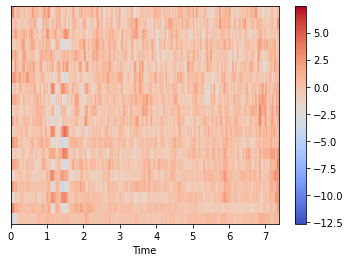

[-53.05091094970703,
 73.53756713867188,
 -11.2623872756958,
 4.19784688949585,
 -16.151874542236328,
 -4.177326679229736,
 -23.719139099121094,
 -9.313030242919922,
 -22.821365356445312,
 -4.265018939971924,
 -21.09817123413086,
 -7.941194534301758,
 -23.312210083007812,
 -7.175851345062256,
 -19.978759765625,
 -4.594926834106445,
 -19.572229385375977,
 -4.416574001312256,
 -15.918462753295898,
 -3.497345209121704]

In [ ]:
stft = np.abs(librosa.stft(a))
mfccs = librosa.feature.mfcc(y=a, sr=fs, dct_type=3)
from sklearn import preprocessing
mfccs = preprocessing.scale(mfccs, axis=1)
librosa.display.specshow(mfccs, sr=fs, x_axis='time')
plt.colorbar()
plt.show()
mfcc = np.mean(librosa.feature.mfcc(y=a, sr=fs).T,axis=0).tolist()
mfcc

Following feature extraction and during analysis of the audio files, it was revealed that two (2206.wav and 0033.wav) did not contain any sound. These were therefore removed from the dataset. The code below was utilised to check that all remaining files did contain sound and so now returns an empty list of files which do not:

In [ ]:
remove = []
for n, file in enumerate(files):
    n, fs = librosa.load(files[n],sr=fs)
    if n.sum()==0:
      remove.append(file)
print(remove)

[]


It was also necessary to remove the associated rows from the dataframe. Below is a summary that shows the frequency of audio files at each location:

In [ ]:
MLENDLS_df = MLENDLS_df.drop(['0033.wav', '2206.wav'])
MLENDLS_df.iloc[:,0:3].value_counts()

area        spot        in_out 
campus      square      outdoor    141
            ground      indoor     139
            canal       outdoor    137
            reception   indoor     136
            curve       indoor     136
            library     outdoor    133
westend     piazza      outdoor    116
            charing     indoor     113
            market      indoor     112
            national    indoor     110
            trafalgar   outdoor    109
            leicester   outdoor    106
british     greatcourt  indoor      84
            room12      indoor      83
            forecourt   outdoor     82
            street      outdoor     77
            square      outdoor     77
Euston      gardens     outdoor     41
            upper       indoor      41
            library     indoor      41
southbank   waterloo    indoor      41
            bridge      outdoor     40
            skate       outdoor     40
Euston      forecourt   outdoor     40
southbank   food        outdoor 

This revelaed an unusual audio file as it has been labelled as 'room13' yet it is known that this was not a location option.

In [ ]:
MLENDLS_df.loc[MLENDLS_df.spot == 'room13']

,area,spot,in_out,Participant
file_id,,,,
0762.wav,british,room13,indoor,S71


Therefore this was also removed from both the dataset and dataframe. The proportion of recordings at area was calculated and is displayed on a graph:

There are 2497 audio files remaining and a dataframe which also contains 2497.


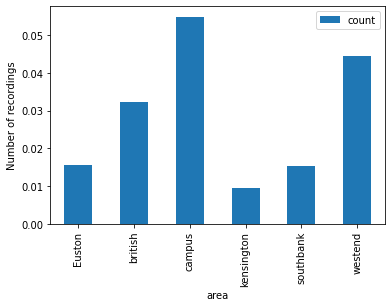

In [ ]:
MLENDLS_df = MLENDLS_df.drop(['0762.wav'])
print(f'There are {len(files)} audio files remaining and a dataframe which also contains {len(MLENDLS_df.index)}.')
p = MLENDLS_df.iloc[:,0:3].value_counts(normalize=True)
p = p.reset_index()
p.columns = ['area', 'spot', 'in_out','count']
p.groupby(['area']).mean().plot(kind='bar')
plt.ylabel('Number of recordings')
plt.show()

The 'campus' location was one of the poorer performing on the indoor/outdoor problem so was chosen for further analysis. It was the most popular location and would therefore provide the greatest number of samples. The feature extraction below was undertaken for the previous problem and saved as a csv. Therefore it was not run but the csv file was utilised.

In [ ]:
def getX(files,labels_file):
  X =[]
  for file in tqdm(files):
    fs = 22050
    a, fs = librosa.load(file,sr=fs)
    a = a/np.max(np.abs(a))

    winLen=0.02
    p = winLen*fs
    frame_length = int(2**int(p-1).bit_length())
    hop_length = frame_length//2
    f0, voiced_flag, voiced_probs = librosa.pyin(y=a, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  
    power = np.sum(a**2)/len(a)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0

    stft = np.abs(librosa.stft(a))
    mfcc = np.mean(librosa.feature.mfcc(y=a, sr=fs).T,axis=0).tolist()

    xi = np.concatenate(([power,pitch_mean,pitch_std],mfcc), axis=None)
    X.append(xi)

  return np.array(X)

X = getX(files, labels_file=MLENDLS_df)
X = pd.DataFrame(X)
X.to_csv('/content/drive/MyDrive/MLEndLS/X.csv')

Below is an extract of the dataframe which contains the feature extractions:

In [ ]:
X = pd.read_csv('/content/drive/MyDrive/MLEndLS/X.csv')
X = X.drop(X.columns[[0]], axis=1)
X

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,0.016295,126.466650,9.951274,-53.050911,73.537567,-11.262387,4.197847,-16.151875,-4.177327,-23.719139,...,-21.098171,-7.941195,-23.312210,-7.175851,-19.978760,-4.594927,-19.572229,-4.416574,-15.918463,-3.497345
1,0.008339,236.702035,48.090692,-127.277000,128.759644,-20.774071,21.884729,-3.889806,12.042579,-1.876464,...,-8.159800,3.714855,-7.436585,2.305155,-7.540562,0.317619,-8.886702,2.328328,-6.328496,5.404270
2,0.003184,0.000000,0.000000,-193.296524,122.203087,-13.880920,29.341072,-0.412256,18.608082,-8.908109,...,-1.674874,2.185726,3.134506,-4.886729,5.699041,-3.775625,0.855509,-0.129307,0.563821,-3.558664
3,0.006249,162.266868,14.223635,-165.802078,154.796158,-34.962685,33.563828,-8.893656,9.665187,-6.586488,...,-6.022288,3.292053,1.248406,-1.276666,-1.287483,3.365114,-0.755328,-1.084744,5.074483,-2.545059
4,0.006028,195.176741,23.027643,-164.830292,149.976532,-8.750062,25.687531,-4.466713,5.297571,-14.639366,...,-4.763224,4.022723,-3.112958,-2.888299,-2.828962,-0.286268,-6.675075,-0.622351,-2.179935,-0.411295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2492,0.011069,139.834136,8.740223,-123.642685,143.625504,-25.139196,43.716965,-25.417711,9.993648,-12.400812,...,6.790106,-2.609026,-1.614286,-1.128993,-4.476809,-3.043346,-8.280586,-1.839829,-5.758088,-1.364969
2493,0.009457,107.088892,8.475027,-161.122131,151.591339,-6.474435,20.310955,1.301536,16.522833,-0.140457,...,-7.044415,5.153109,-4.262436,4.255354,-2.474103,3.963517,-4.825941,3.931405,-5.153931,1.012224
2494,0.006861,335.961638,53.141294,-189.185501,135.290512,-15.262609,0.864056,-7.967041,-9.769885,-30.665756,...,-18.055462,-0.746700,-6.363811,-7.967967,1.549077,-9.084648,-1.919399,-2.933250,-8.615412,1.751181
2495,0.014912,156.214537,4.279698,-123.541512,153.995575,-21.242968,38.136276,-8.659588,12.319400,-0.269852,...,12.055073,-6.575983,0.822475,-7.241724,-10.827791,10.167727,-15.767893,10.154431,-17.414778,14.061285


An overview of the data is provided below as well as a pairplot. This confirmed that all of the data looks suitable. Although one concern was the number of zero values for the Pitch features that resulted from some of the files returning NaN for f0. The MFCCs look to generally be normally distributed, whereas as the Power and Pitch features are positively skewed. There looks to be some correlation between features but the Pearson's correlation coefficient is less than 0.75 in all cases.

In [ ]:
X.describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,...,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000,822.000000
mean,0.012043,154.218030,21.697240,-161.355224,128.245011,-11.445708,30.107328,-2.299911,13.608091,-7.037413,...,-5.405706,2.163484,-4.698867,0.573239,-4.004080,1.245174,-6.179131,2.383745,-4.779770,0.752377
std,0.008232,74.225590,21.563182,65.781532,26.826140,17.297502,12.030941,11.662107,9.858882,9.184114,...,7.802309,6.776784,7.228771,6.432553,5.418267,5.144476,5.127332,4.550308,4.572880,4.382149
min,0.000634,0.000000,0.000000,-340.099701,14.635121,-95.586617,-10.721975,-48.204929,-16.745554,-36.469215,...,-36.725075,-26.239370,-27.405504,-31.942572,-21.496607,-14.700664,-25.099859,-16.458355,-23.061949,-16.049873
25%,0.006320,117.441855,8.484446,-206.884014,113.892540,-21.236265,22.100754,-9.141292,7.431848,-13.039007,...,-10.574461,-1.411231,-9.470680,-2.701413,-7.833361,-2.151593,-9.415661,-0.341385,-7.321547,-1.852785
50%,0.009801,145.707507,15.619829,-160.751152,129.971535,-10.876622,29.805294,-1.668238,13.574689,-7.013725,...,-6.052365,2.706671,-5.180947,1.048531,-4.343280,1.166315,-5.837870,2.116301,-4.523155,0.645979
75%,0.015308,204.605567,26.888987,-111.845327,145.884117,0.158192,38.057163,5.060277,19.893254,-0.747991,...,-0.762088,6.352728,-0.931182,4.642555,-0.635705,4.616456,-2.492517,4.982453,-1.766912,3.384707
max,0.064338,449.941853,142.312765,18.255951,214.908752,32.869064,76.488678,35.503166,47.934486,18.673967,...,23.373335,30.340515,34.875614,24.952656,16.591352,22.065107,8.778369,18.148630,15.703461,21.403057


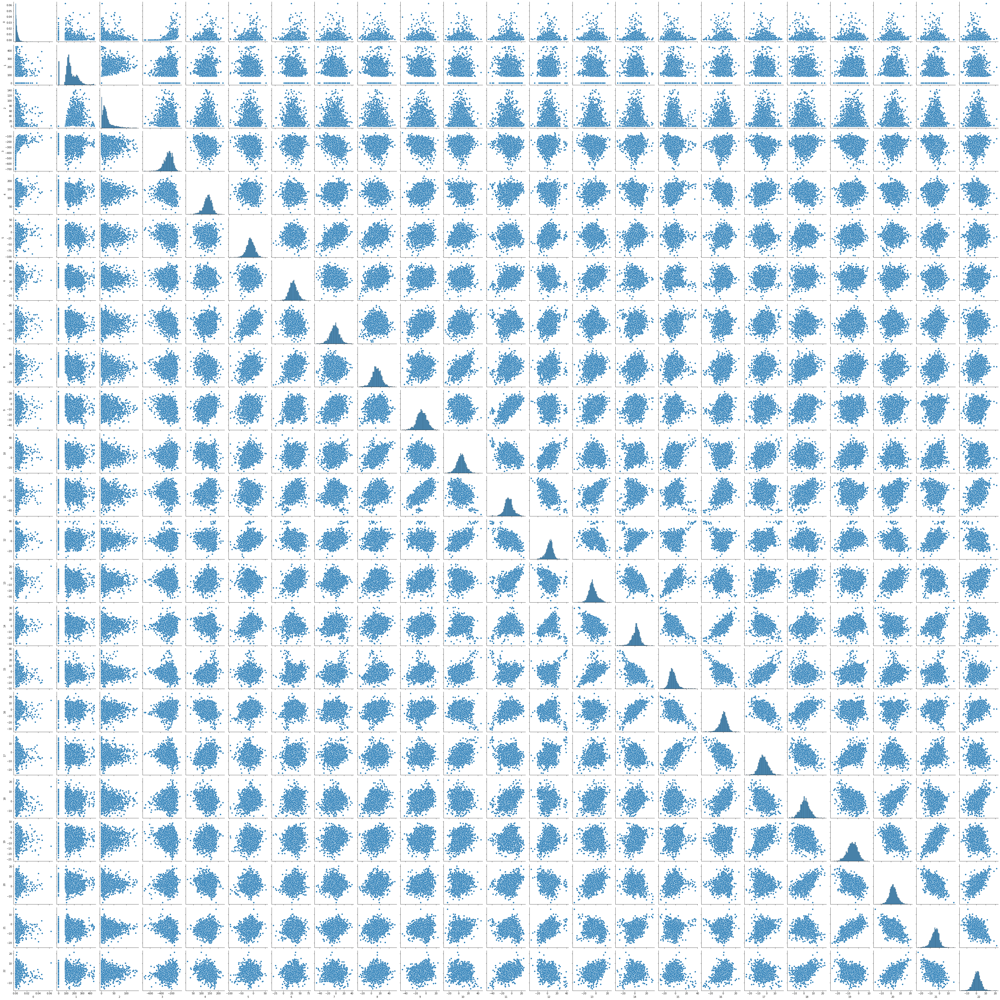

In [ ]:
import seaborn as sns
sns.pairplot(X)

The classifier labels (six spots from 'campus' location) are extracted from the data frame.

In [ ]:
spots= ['square', 'library', 'canal', 'ground','curve','reception']
def getSpots(files,labels_file):
    z = []
    for file in tqdm(files):
      fileID = file.split('/')[-1]
      if(labels_file.loc[fileID]['spot']==spots[0]):
          zi = 0
      elif(labels_file.loc[fileID]['spot']==spots[1]):
          zi = 1
      elif(labels_file.loc[fileID]['spot']==spots[2]):
          zi = 2
      elif(labels_file.loc[fileID]['spot']==spots[3]):
          zi = 3
      elif(labels_file.loc[fileID]['spot']==spots[4]):
          zi = 4
      elif(labels_file.loc[fileID]['spot']==spots[5]):
          zi = 5
      else:
          zi = 9
      z.append(zi)

    return np.array(z)

z = getSpots(files,labels_file=MLENDLS_df)

100%|██████████| 2497/2497 [00:01<00:00, 1995.30it/s]


In addition, the area and spot attributes were extracted as well as the indoor classifier used on the previous project.

In [ ]:
def getAttributes(files,labels_file):
  atts =[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    area = labels_file.loc[fileID].loc['area']
    spot = labels_file.loc[fileID].loc['spot']
    p = labels_file.loc[fileID].loc['Participant']
    zi = np.concatenate(([area, spot, p]), axis=None)
    atts.append(zi)
  return np.array(atts)

def gety(files,labels_file):
  y =[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor'
    y.append(yi)
  return np.array(y)

atts = getAttributes(files,labels_file=MLENDLS_df)
y = gety(files,labels_file=MLENDLS_df)

100%|██████████| 2497/2497 [00:00<00:00, 15057.21it/s]


The data was filtered for the 'campus' locations, of which there are 822 audio segments.

In [ ]:
print(len(MLENDLS_df[MLENDLS_df['area']=='campus'].index.values))
mask = atts[:,0] == 'campus'
X = X.loc[mask]
y = y[mask]
z = z[mask]
atts = atts[mask]
print(f'We have reduced the dataset to {len(z)}.')

822
We have reduced the dataset to 822.


Finally, the data is split into training and testing subsets.

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, z_train, z_test, y_train, y_test, atts_train, atts_test = train_test_split(X,z,y,atts,test_size=0.2)
X_train.shape, X_test.shape, z_train.shape, z_test.shape

((657, 23), (165, 23), (657,), (165,))

# 8 Results

The pipeline that was utilised for the previous project was trained on just the 'campus' data to see if the accuracy would improve from 75%.

In [ ]:
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC

Pipeline = make_pipeline(preprocessing.StandardScaler(), SVC())
Pipeline.fit(X_train, y_train)
y_pred = Pipeline.predict(X_test)

print(f'Training accuracy of {round(Pipeline.score(X_train, y_train),3)}.')
print(f'Testing accuracy of {round(Pipeline.score(X_test, y_test),3)}.')

Training accuracy of 0.881.
Testing accuracy of 0.782.


It is interesting to discover that it has performed only a little better. The training accuracy is much better than that achieved in the previous project although that included data for all six areas so there more variation.

The Grid Search CV is performed to tune the hyperparameters of the SVC but with the spots as the classifier.

In [ ]:
from sklearn.model_selection import GridSearchCV

parameters = {'C': [0.1,1, 10, 100], 
    'gamma': [1,0.1,0.01,0.001],
    'kernel': ['rbf', 'poly', 'sigmoid']}
grid = GridSearchCV(SVC(),parameters,cv=5)
scaler = preprocessing.StandardScaler()
scaled = scaler.fit_transform(X_train)
grid.fit(scaled, z_train)

print("tuned hpyerparameters :(best parameters) ",grid.best_params_)
print("accuracy :",grid.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
accuracy : 0.6590562109646079


The pipeline with these parameters was then trained utilising all of the training dataset. Its accuracy for this was considered but its performance was assessed using the test dataset and a confusion matrix was produced.

Training accuracy of 0.782.
Testing accuracy of 0.6.
Testing confusion matrix:
 [[16  4  4  0  2  3]
 [ 4 12  3  2  3  3]
 [ 3  4 15  1  2  0]
 [ 0  2  0 26  2  4]
 [ 2  2  2  3 18  0]
 [ 3  1  2  2  3 12]]



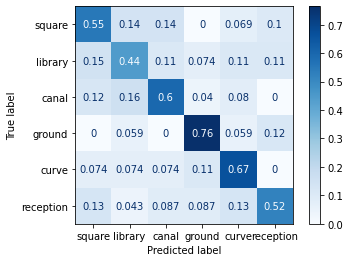

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score

Pipeline = make_pipeline(preprocessing.StandardScaler(), SVC(C=100, gamma=0.001, kernel='rbf'))
Pipeline.fit(X_train, z_train)
z_pred = Pipeline.predict(X_test)
print(f'Training accuracy of {round(Pipeline.score(X_train, z_train),3)}.')
print(f'Testing accuracy of {round(Pipeline.score(X_test, z_test),3)}.')
print('Testing confusion matrix:\n {}\n'.format(confusion_matrix(z_test, z_pred)))
ConfusionMatrixDisplay(confusion_matrix(z_test, z_pred,normalize='true'),display_labels=spots).plot(cmap='Blues')
plt.show()

The testing accuracy of 60% is not impressive but it is not too much lower than the 78% achieved for the binary classification of indoor and outdoor. There is a large variation between the spots with it performing best for 'ground' and worst for 'library'. It is know that the 'library' and 'square' spots are quite similar and this is reflected in the confusion matrix with 15% of 'library' samples being classified as 'square' and 14% in the reverse.

One consideration was that the misclassification was more common for some participants.

In [ ]:
mask2 = z_test != z_pred
mistakes = atts_test[mask2]
unique, counts = np.unique(mistakes[:,2], return_counts=True)
print(np.asarray((unique, counts)).T)
len(unique)

[['S1' '1']
 ['S103' '2']
 ['S108' '1']
 ['S109' '1']
 ['S112' '1']
 ['S113' '1']
 ['S117' '1']
 ['S121' '1']
 ['S126' '1']
 ['S131' '1']
 ['S134' '1']
 ['S135' '3']
 ['S136' '1']
 ['S144' '1']
 ['S145' '1']
 ['S146' '2']
 ['S147' '1']
 ['S151' '1']
 ['S154' '2']
 ['S159' '1']
 ['S167' '1']
 ['S168' '1']
 ['S172' '1']
 ['S174' '1']
 ['S179' '1']
 ['S182' '1']
 ['S186' '1']
 ['S187' '1']
 ['S19' '1']
 ['S191' '1']
 ['S24' '1']
 ['S25' '1']
 ['S34' '1']
 ['S37' '1']
 ['S40' '4']
 ['S42' '1']
 ['S48' '1']
 ['S51' '2']
 ['S52' '1']
 ['S55' '1']
 ['S6' '1']
 ['S60' '1']
 ['S62' '2']
 ['S69' '1']
 ['S72' '2']
 ['S75' '2']
 ['S76' '1']
 ['S8' '1']
 ['S81' '1']
 ['S82' '1']
 ['S88' '1']
 ['S92' '1']
 ['S93' '1']
 ['S95' '1']]


54

54 out of 141 participants had at least one misclassification so the problem was reasonably widespread. However it is worth noting that participant S40 had four misclassifications and S135 had three. This could have arisen due to their recording device or possibly their recordings were done at less typical times of the day. Hopefully it was not because they mis-labelled their submissions!

Finally, deployment would be done using the following model that has been trained on all of the campus audio segments:

In [ ]:
final = Pipeline.fit(X, z)

# 9 Conclusions

The machine learning pipeline that was built extracted features from audio segments, these were normalised and then a Support Vector Machine (SVM) was utilised for multiclass classification. The hyperparameters were tuned utilising a Grid Search cross-validation. The resulting pipleine had an accuracy of 60.0% but there was significant variation between locations. The pipeline was best with classifying the 'ground' location.

In order to improve the classification, alternative feature extractions should be explored. MFCCs are typically used for voice recognition and were deemed useful with the indoor/outdoor classification problem but may have been less powerful for the multiclass problem. This illustrates the potential issue that can arise with redeploying a model that was used to solve a different.